## Part 1 - D

In [16]:
#/home/onyxia/work
# !pip install pandas
# !pip install geopandas
# !pip install folium
# !pip install mapclassify
# !pip install matplotlib
# !pip install duckdb
# !pip install branca
# !pip install gdal
# !pip install psycopg2-binary sqlalchemy geopandas


In [1]:
import geopandas as gpd

final_data=gpd.read_file('/home/onyxia/work/Clean_Bases/final_data_20_24.gpkg')

final_data.head(3)

,SWI_UNIF_MENS,ym,swi_min,swi_mean,swi_max,prenei_sum,preliq_sum,pe_sum,evap_sum,t_avg,...,nom_officiel_en_majuscules,numero_du_canton,code_insee,codes_insee_des_arrondissements,code_insee_du_departement,code_insee_de_la_region,composition_du_canton,dept_name,region_name,geometry
0,0.949,2020-01,0.861,0.90229,0.956,0.0,48.2,29.5,18.7,7.225806,...,DUNKERQUE-2,17,5917,594,59,32,Fraction d'une commune et de commune(s) entièr...,Nord,Hauts-de-France,POINT (665362 7106108)
1,0.957,2020-01,0.858,0.90429,0.956,0.0,45.3,24.5,20.8,7.319355,...,MARCK,34,6234,626,62,32,Commune(s) entière(s),Pas-de-Calais,Hauts-de-France,POINT (625315 7098447)
2,0.957,2020-01,0.857,0.90400,0.956,0.0,45.3,24.8,20.5,7.319355,...,MARCK,34,6234,626,62,32,Commune(s) entière(s),Pas-de-Calais,Hauts-de-France,POINT (633311 7098380)


In [2]:
# Dictionary: INSEE code -> department name
insee_dept_dict = {
    "01": "Ain",
    "02": "Aisne",
    "03": "Allier",
    "04": "Alpes-de-Haute-Provence",
    "05": "Hautes-Alpes",
    "06": "Alpes-Maritimes",
    "07": "Ardèche",
    "08": "Ardennes",
    "09": "Ariège",
    "10": "Aube",
    "11": "Aude",
    "12": "Aveyron",
    "13": "Bouches-du-Rhône",
    "14": "Calvados",
    "15": "Cantal",
    "16": "Charente",
    "17": "Charente-Maritime",
    "18": "Cher",
    "19": "Corrèze",
    "2A": "Corse-du-Sud",
    "2B": "Haute-Corse",
    "21": "Côte-d'Or",
    "22": "Côtes-d'Armor",
    "23": "Creuse",
    "24": "Dordogne",
    "25": "Doubs",
    "26": "Drôme",
    "27": "Eure",
    "28": "Eure-et-Loir",
    "29": "Finistère",
    "30": "Gard",
    "31": "Haute-Garonne",
    "32": "Gers",
    "33": "Gironde",
    "34": "Hérault",
    "35": "Ille-et-Vilaine",
    "36": "Indre",
    "37": "Indre-et-Loire",
    "38": "Isère",
    "39": "Jura",
    "40": "Landes",
    "41": "Loir-et-Cher",
    "42": "Loire",
    "43": "Haute-Loire",
    "44": "Loire-Atlantique",
    "45": "Loiret",
    "46": "Lot",
    "47": "Lot-et-Garonne",
    "48": "Lozère",
    "49": "Maine-et-Loire",
    "50": "Manche",
    "51": "Marne",
    "52": "Haute-Marne",
    "53": "Mayenne",
    "54": "Meurthe-et-Moselle",
    "55": "Meuse",
    "56": "Morbihan",
    "57": "Moselle",
    "58": "Nièvre",
    "59": "Nord",
    "60": "Oise",
    "61": "Orne",
    "62": "Pas-de-Calais",
    "63": "Puy-de-Dôme",
    "64": "Pyrénées-Atlantiques",
    "65": "Hautes-Pyrénées",
    "66": "Pyrénées-Orientales",
    "67": "Bas-Rhin",
    "68": "Haut-Rhin",
    "69": "Rhône",
    "70": "Haute-Saône",
    "71": "Saône-et-Loire",
    "72": "Sarthe",
    "73": "Savoie",
    "74": "Haute-Savoie",
    "75": "Paris",
    "76": "Seine-Maritime",
    "77": "Seine-et-Marne",
    "78": "Yvelines",
    "79": "Deux-Sèvres",
    "80": "Somme",
    "81": "Tarn",
    "82": "Tarn-et-Garonne",
    "83": "Var",
    "84": "Vaucluse",
    "85": "Vendée",
    "86": "Vienne",
    "87": "Haute-Vienne",
    "88": "Vosges",
    "89": "Yonne",
    "90": "Territoire de Belfort",
    "91": "Essonne",
    "92": "Hauts-de-Seine",
    "93": "Seine-Saint-Denis",
    "94": "Val-de-Marne",
    "95": "Val-d'Oise",
    "971": "Guadeloupe",
    "972": "Martinique",
    "973": "Guyane",
    "974": "La Réunion",
    "976": "Mayotte"
}

final_data["dept_name"] = final_data["code_insee_du_departement"].map(insee_dept_dict)

In [3]:
insee_region_dict = {
    "01": "Guadeloupe",
    "02": "Martinique",
    "03": "Guyane",
    "04": "La Réunion",
    "06": "Mayotte",
    "11": "Île-de-France",
    "24": "Centre-Val de Loire",
    "27": "Bourgogne-Franche-Comté",
    "28": "Normandie",
    "32": "Hauts-de-France",
    "44": "Grand Est",
    "52": "Pays de la Loire",
    "53": "Bretagne",
    "75": "Nouvelle-Aquitaine",
    "76": "Occitanie",
    "84": "Auvergne-Rhône-Alpes",
    "93": "Provence-Alpes-Côte d'Azur",
    "94": "Corse"
}

final_data["region_name"] = final_data["code_insee_de_la_region"].map(insee_region_dict)

In [4]:
final_data.to_file("/home/onyxia/work/Clean_Bases/final_data_20_24.gpkg", layer="data", driver="GPKG")

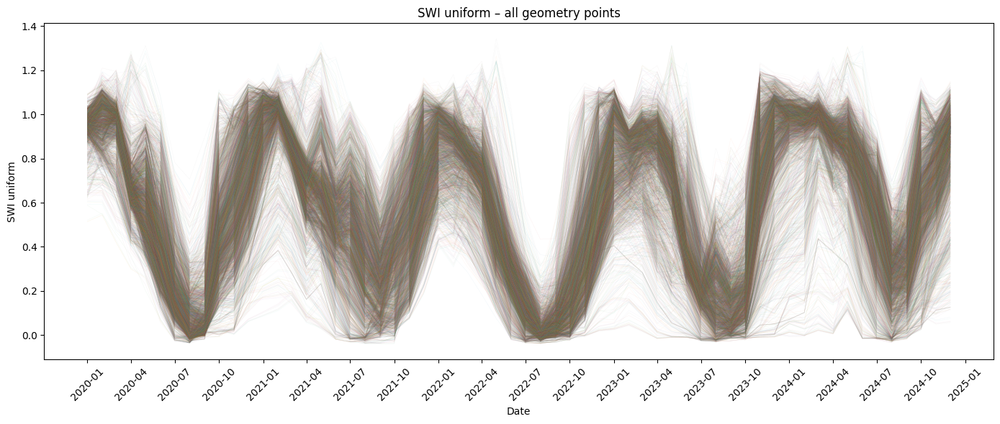

In [5]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd

fig, ax = plt.subplots(figsize=(14, 6))

for _, g in final_data.groupby("geometry"):
    ax.plot(
        pd.to_datetime(g["ym"], format="%Y-%m"),  # temporary conversion
        g["SWI_UNIF_MENS"],
        linewidth=0.4,
        alpha=0.05
    )

# Quarterly ticks (Jan / Apr / Jul / Oct)
ax.xaxis.set_major_locator(mdates.MonthLocator(bymonth=[1, 4, 7, 10]))
ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y-%m"))

ax.set_xlabel("Date")
ax.set_ylabel("SWI uniform")
ax.set_title("SWI uniform – all geometry points")

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


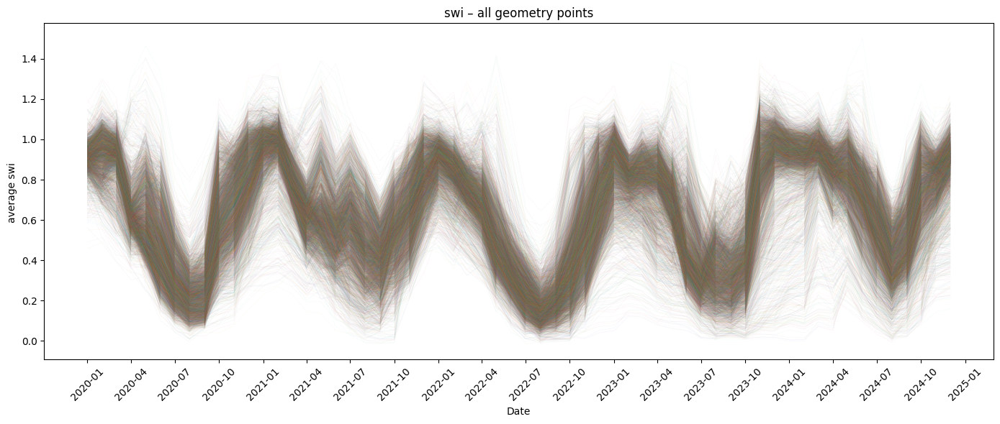

In [6]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd

fig, ax = plt.subplots(figsize=(14, 6))

for _, g in final_data.groupby("geometry"):
    ax.plot(
        pd.to_datetime(g["ym"], format="%Y-%m"),  # temporary conversion
        g["swi_mean"],
        linewidth=0.4,
        alpha=0.05
    )

# Quarterly ticks (Jan / Apr / Jul / Oct)
ax.xaxis.set_major_locator(mdates.MonthLocator(bymonth=[1, 4, 7, 10]))
ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y-%m"))

ax.set_xlabel("Date")
ax.set_ylabel("average swi ")
ax.set_title("swi – all geometry points")

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [7]:
final_data[["swi_mean", "SWI_UNIF_MENS"]].corr(method="pearson")


,swi_mean,SWI_UNIF_MENS
swi_mean,1.00000,0.96406
SWI_UNIF_MENS,0.96406,1.00000


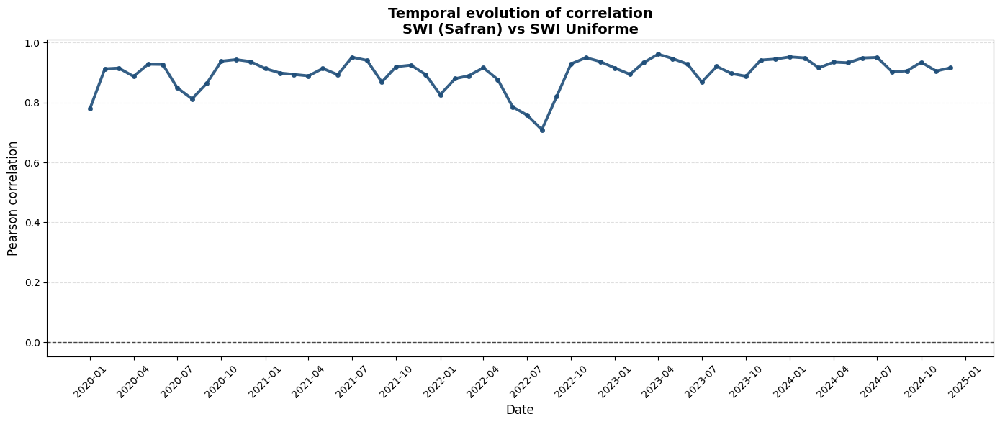

In [13]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Conversion en datetime
df = final_data.copy()
df["ym_dt"] = pd.to_datetime(df["ym"], format="%Y-%m")

# Corrélation mensuelle sur toutes les géométries
corr_ts = (
    df
    .groupby("ym_dt")[["swi_mean", "SWI_UNIF_MENS"]]
    .corr()
    .iloc[0::2, -1]  # extrait corr(swi_mean, SWI_UNIF_MENS)
    .reset_index()
)

corr_ts = corr_ts.rename(columns={"SWI_UNIF_MENS": "corr"})

import matplotlib.pyplot as plt
import matplotlib.dates as mdates

fig, ax = plt.subplots(figsize=(14, 6))

ax.plot(
    corr_ts["ym_dt"],
    corr_ts["corr"],
    color="#1f4e79",        # bleu sobre
    linewidth=2.8,
    marker="o",
    markersize=4,
    alpha=0.9
)

# Axe du temps : trimestres
ax.xaxis.set_major_locator(mdates.MonthLocator(bymonth=[1, 4, 7, 10]))
ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y-%m"))

# Ligne zéro
ax.axhline(0, color="black", linestyle="--", linewidth=1, alpha=0.7)

# Grille légère
ax.grid(
    which="major",
    axis="y",
    linestyle="--",
    linewidth=0.8,
    alpha=0.4
)

# Labels
ax.set_xlabel("Date", fontsize=12)
ax.set_ylabel("Pearson correlation", fontsize=12)
ax.set_title(
    "Temporal evolution of correlation\nSWI (Safran) vs SWI Uniforme",
    fontsize=14,
    weight="bold"
)

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [9]:
final_data[["swi_mean", "SWI_UNIF_MENS"]].corr(method="spearman")


,swi_mean,SWI_UNIF_MENS
swi_mean,1.000000,0.965116
SWI_UNIF_MENS,0.965116,1.000000


In [10]:
corr_by_geom = (
    final_data
    .groupby("geometry")[["swi_mean", "SWI_UNIF_MENS"]]
    .corr()
    .iloc[0::2, -1]   # select swi_mean vs SWI_UNIF_MENS
    .reset_index()
    .drop(columns="level_1")  # remove the unnecessary column
    .rename(columns={"SWI_UNIF_MENS": "corr_pearson"})
)

corr_by_geom


,geometry,corr_pearson
0,POINT (338733 6277426),0.981678
1,POINT (338668 6269435),0.986590
2,POINT (330677 6269500),0.980866
3,POINT (322621 6261575),0.984276
4,POINT (314630 6261640),0.984669
...,...,...
6171,POINT (1224324 6110090),0.982797
6172,POINT (1224394 6118080),0.983646
6173,POINT (1232384 6118009),0.976839
6174,POINT (1224254 6102100),0.994531


In [11]:
corr_by_geom["corr_pearson"].describe()


count    6176.000000
mean        0.974282
std         0.016189
min         0.890928
25%         0.963930
50%         0.977963
75%         0.987338
max         0.998627
Name: corr_pearson, dtype: float64

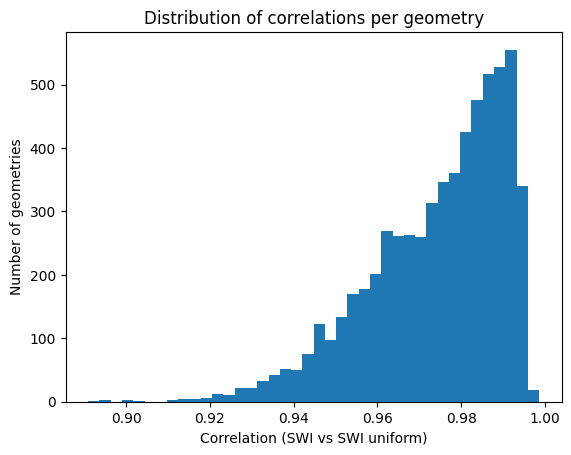

In [26]:
import matplotlib.pyplot as plt

plt.hist(corr_by_geom["corr_pearson"], bins=40)
plt.xlabel("Correlation (SWI vs SWI uniform)")
plt.ylabel("Number of geometries")
plt.title("Distribution of correlations per geometry")
plt.show()


In [27]:
# Keep only one row per geometry with the additional info
geo_data = final_data[["geometry", "dept_name", "region_name", "nom_officiel"]].drop_duplicates()

# Merge correlation
geo_data = geo_data.merge(
    corr_by_geom,           # has geometry + corr_pearson
    on="geometry",
    how="left"
)


In [28]:
import geopandas as gpd

geo_data.explore(
    column="corr_pearson",       # color points by correlation
    cmap="viridis",
    tooltip=["dept_name", "region_name", "nom_officiel", "corr_pearson"],  # info on hover
    marker_kwds={"radius": 5},   # size of points
    legend=True
)


In [29]:
# Aggregate by geometry: mean SWI and mean SWI_UNIF per point
geo_diff = (
    final_data.groupby("geometry")[["swi_mean", "SWI_UNIF_MENS"]]
    .mean()  # average over time if multiple observations per geometry
    .reset_index()
)

# Compute absolute difference
geo_diff["abs_diff"] = abs(geo_diff["swi_mean"] - geo_diff["SWI_UNIF_MENS"])

# Merge metadata (department, region, official name)
meta = final_data[["geometry", "dept_name", "region_name", "nom_officiel"]].drop_duplicates()
geo_diff = geo_diff.merge(meta, on="geometry", how="left")


In [30]:
import geopandas as gpd

# If geo_diff is a plain DataFrame, convert it
geo_diff = gpd.GeoDataFrame(geo_diff, geometry="geometry")

# Make sure CRS is set (example: EPSG 2154 or whatever your data uses)
geo_diff.set_crs(epsg=2154, inplace=True)



geo_diff.explore(
    column="abs_diff",                 # color points by absolute difference
    cmap="Reds",                       # red = large difference
    tooltip=["dept_name", "region_name", "nom_officiel", "abs_diff"],  # info on hover
    marker_kwds={"radius": 5},         # point size
    legend=True
)


In [31]:
q75 = geo_diff["abs_diff"].quantile(0.75)

q75


np.float64(0.08498230490889346)

In [32]:
geo_diff_q75 = geo_diff[geo_diff["abs_diff"] >= q75].copy()
geo_diff_q75.reset_index(drop=True, inplace=True)

geo_diff_q75.explore(
    column="abs_diff",
    cmap="Reds",
    legend=True,
    tooltip=[
        "region_name",
        "dept_name",
        "nom_officiel",
        "abs_diff"
    ],
    marker_kwds={
        "radius": 6,
        "fillOpacity": 0.7
    },
    tiles="CartoDB positron"
)


In [33]:
dept_share = (
    geo_diff_q75
    .groupby(["dept_name"])
    .size()
    .reset_index(name="n_points")
)

dept_share["percentage"] = (
    100 * dept_share["n_points"] / dept_share["n_points"].sum()
)


top30_dept = (
    dept_share
    .sort_values("percentage", ascending=False)
    .head(30)
)


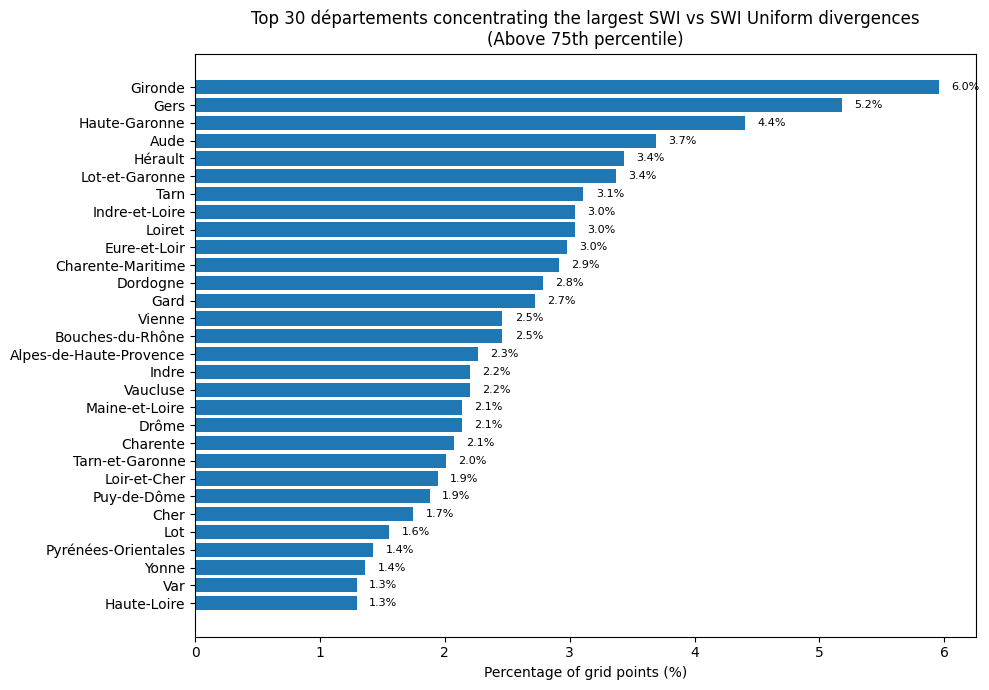

In [34]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(10, 7))

ax.barh(
    top30_dept["dept_name"][::-1],
    top30_dept["percentage"][::-1]
)

ax.set_xlabel("Percentage of grid points (%)")
ax.set_title(
    "Top 30 départements concentrating the largest SWI vs SWI Uniform divergences\n"
    "(Above 75th percentile)"
)

# Optional: add value labels
for i, v in enumerate(top30_dept["percentage"][::-1]):
    ax.text(v + 0.1, i, f"{v:.1f}%", va="center", fontsize=8)

plt.tight_layout()
plt.show()


In [35]:
region_share = (
    geo_diff_q75
    .groupby("region_name")
    .size()
    .reset_index(name="n_points")
)

region_share["percentage"] = (
    100 * region_share["n_points"] / region_share["n_points"].sum()
)

top_regions = (
    region_share
    .sort_values("percentage", ascending=False)
    .head(30)   # il y aura de toute façon < 30 régions
)


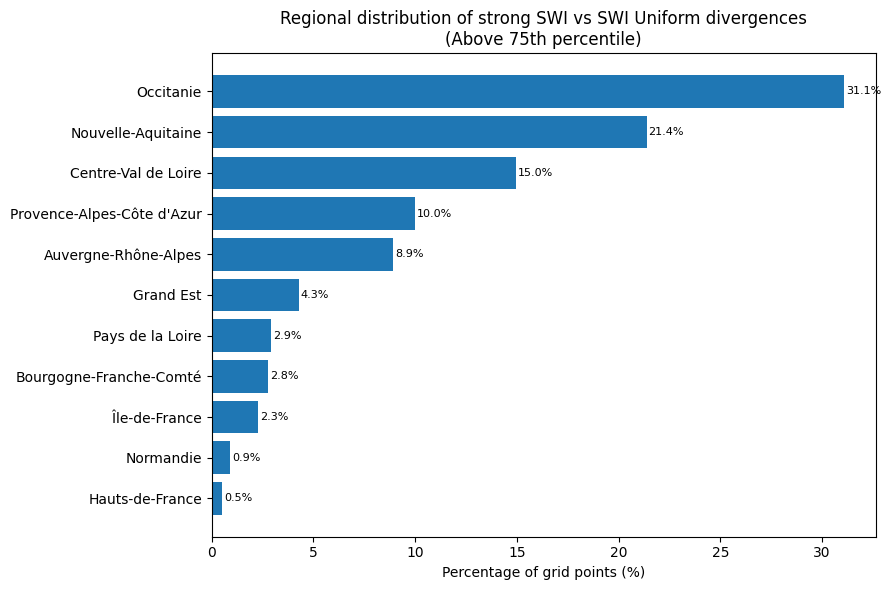

In [36]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(9, 6))

ax.barh(
    top_regions["region_name"][::-1],
    top_regions["percentage"][::-1]
)

ax.set_xlabel("Percentage of grid points (%)")
ax.set_title(
    "Regional distribution of strong SWI vs SWI Uniform divergences\n"
    "(Above 75th percentile)"
)

# Labels de valeur
for i, v in enumerate(top_regions["percentage"][::-1]):
    ax.text(v + 0.1, i, f"{v:.1f}%", va="center", fontsize=8)

plt.tight_layout()
plt.show()


In [37]:
final_data["NIVEAU"].value_counts()

NIVEAU
2.0    178980
1.0    121740
3.0     69840
Name: count, dtype: int64

In [38]:
final_data["ALEA"].value_counts()

ALEA
Moyen     178980
Faible    121740
Fort       69840
Name: count, dtype: int64

By clay soils contents

In [39]:
import geopandas as gpd

gdf_niveau = (
    final_data
    .loc[:, ["geometry", "NIVEAU", "dept_name", "region_name", "nom_officiel"]]
    .drop_duplicates(subset="geometry")
    .copy()
)

gdf_niveau = gpd.GeoDataFrame(
    gdf_niveau,
    geometry="geometry",
    crs=final_data.crs
)


In [40]:
gdf_niveau.explore(
    column="NIVEAU",
    categorical=True,          # IMPORTANT for hazard levels
    legend=True,
    tooltip=[
        "region_name",
        "dept_name",
        "nom_officiel",
        "NIVEAU"
    ],
    marker_kwds={
        "radius": 5,
        "fillOpacity": 0.7
    },
    tiles="CartoDB positron"
)


In [41]:
final_data = final_data.copy()

final_data["diff_swi"] = (
    final_data["swi_mean"] - final_data["SWI_UNIF_MENS"]
).abs()


In [42]:
df_anova = final_data[["ALEA", "diff_swi"]].dropna()
df_anova["ALEA"].value_counts()


ALEA
Moyen     178980
Faible    121740
Fort       69840
Name: count, dtype: int64

In [43]:
from scipy.stats import f_oneway

groups = [
    df_anova.loc[df_anova["ALEA"] == a, "diff_swi"].values
    for a in df_anova["ALEA"].unique()
]

f_stat, p_value = f_oneway(*groups)

f_stat, p_value


(np.float64(3136.0128168654073), np.float64(0.0))

In [44]:
import pandas as pd

anova_results = pd.DataFrame({
    "F_statistic": [f_stat],
    "p_value": [p_value]
})

anova_results


,F_statistic,p_value
0,3136.012817,0.0


In [45]:
import statsmodels.formula.api as smf

# Ensure ALEA is treated as categorical
df_anova["ALEA"] = df_anova["ALEA"].astype("category")

# Fit linear model
model = smf.ols("diff_swi ~ ALEA", data=df_anova).fit()

# Show coefficients
model.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               diff_swi   R-squared:                       0.017
Model:                            OLS   Adj. R-squared:                  0.017
Method:                 Least Squares   F-statistic:                     3136.
Date:                Tue, 23 Dec 2025   Prob (F-statistic):               0.00
Time:                        15:40:29   Log-Likelihood:             4.6207e+05
No. Observations:              370560   AIC:                        -9.241e+05
Df Residuals:                  370557   BIC:                        -9.241e+05
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept         0.0829      0.000    416.052      0.000       0.083       0.083
ALEA[T.Fort]      0.0261      0.000     79.003      0.000       0.025       0.027
ALEA[T.Moyen]     0.0082      0.000     31.902      0.000       0.008       0.009
==============================================================================
Omnibus:                    36332.464   Durbin-Watson:                   0.355
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            47948.130
Skew:                           0.867   Prob(JB):                         0.00
Kurtosis:                       3.311   Cond. No.                         3.99
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""